<a href="https://colab.research.google.com/github/drashuk/Asian/blob/main/Parcial_2_Machine_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importamos todo lo necesario y montamos el disco de Google Drive

In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from sklearn import preprocessing
# Normalización y estandarización.
from sklearn.preprocessing import MinMaxScaler
# Imputación.
from sklearn.impute import KNNImputer
# Montamos la Unidad de Google Drive debido a que el archivo es muy pesado.
from google.colab import drive
drive.mount('/content/drive')





Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
df = pd.read_excel('/content/drive/My Drive/ML/BaseC.xlsx')
df

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,...,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target
0,1,160,M,13.0,43,NaN,130,1,1,0,...,0.0,33000,0.0,1099866.0,0.0,1099866.0,15080,0.0,R,0
1,2,160,H,13.0,46,143640.0,69,1,0,0,...,0.0,300000,0.0,214592.0,0.0,214592.0,83596,0.0,R,0
2,3,170,H,13.0,45,929106.0,24,1,1,0,...,0.0,216676,0.0,0.0,0.0,7400.0,0,0.0,T,0
3,4,151,H,13.0,46,172447.0,134,0,1,0,...,0.0,60000,0.0,272762.0,0.0,272762.0,10591,0.0,R,0
4,5,170,H,13.0,46,805250.0,116,0,1,1,...,0.0,272925,0.0,249562.0,0.0,75339.0,377782,0.0,R,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,51120,160,H,13.0,51,364978.0,57,1,1,1,...,0.0,300000,0.0,478320.0,0.0,478320.0,12668,0.0,R,0
51120,51121,170,H,13.0,51,625376.0,39,1,0,0,...,0.0,166098,0.0,166098.0,0.0,0.0,572363,0.0,R,0
51121,51122,160,H,13.0,47,806220.0,153,1,1,0,...,0.0,18891,0.0,9652.0,0.0,9652.0,16241,0.0,R,0
51122,51123,160,M,13.0,47,NaN,11,1,0,0,...,0.0,26528,0.0,24638.0,0.0,24638.0,84982,0.0,R,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51124 entries, 0 to 51123
Columns: 574 entries, Id to target
dtypes: float64(508), int64(53), object(13)
memory usage: 223.9+ MB


In [13]:
dfnuevo = df[['Subsegmento', 'Sexo', 'Region', 'Edad', 'Renta', 'Antiguedad', 'Internauta', 'Adicional', 'Dualidad', 'Consumo', 'Debito',
             'Ctacte', 'Cuentas', 'Hipotecario', 'Monoproducto', 'TC', 'CUPO_L1', 'CUPO_MX', 'CUPO_L2']]

dfnuevo

,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Consumo,Debito,Ctacte,Cuentas,Hipotecario,Monoproducto,TC,CUPO_L1,CUPO_MX,CUPO_L2
0,160,M,13.0,43,NaN,130,1,1,0,0,1,1,1,0,0,3,798000,1210.0,1012000.0
1,160,H,13.0,46,143640.0,69,1,0,0,0,0,1,1,1,0,1,750000,1000.0,150000.0
2,170,H,13.0,45,929106.0,24,1,1,0,0,1,1,1,1,0,2,1350000,1500.0,200000.0
3,151,H,13.0,46,172447.0,134,0,1,0,0,0,0,1,0,1,2,1570800,0.0,220001.0
4,170,H,13.0,46,805250.0,116,0,1,1,0,0,1,2,1,0,3,2762000,6430.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,160,H,13.0,51,364978.0,57,1,1,1,0,1,1,2,0,0,3,999000,550.0,1000.0
51120,170,H,13.0,51,625376.0,39,1,0,0,0,1,1,1,0,0,1,1744200,300.0,1.0
51121,160,H,13.0,47,806220.0,153,1,1,0,0,1,1,1,0,0,2,1061000,1526.0,194700.0
51122,160,M,13.0,47,NaN,11,1,0,0,0,0,1,1,0,0,1,1612000,2300.0,300000.0


In [14]:
# Identificamos el tipo de datos de cada variable.
dfnuevo.dtypes

Subsegmento       int64
Sexo             object
Region          float64
Edad              int64
Renta           float64
Antiguedad        int64
Internauta        int64
Adicional         int64
Dualidad          int64
Consumo           int64
Debito            int64
Ctacte            int64
Cuentas           int64
Hipotecario       int64
Monoproducto      int64
TC                int64
CUPO_L1           int64
CUPO_MX         float64
CUPO_L2         float64
dtype: object

In [15]:
dfnuevo.describe()

,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Consumo,Debito,Ctacte,Cuentas,Hipotecario,Monoproducto,TC,CUPO_L1,CUPO_MX,CUPO_L2
count,51124.000000,51071.000000,51124.000000,3.775900e+04,51124.000000,51124.000000,51124.000000,51124.000000,51124.000000,51124.000000,51124.000000,51124.000000,51124.000000,51124.000000,51124.000000,5.112400e+04,51124.000000,5.112400e+04
mean,182.024274,10.828220,38.702879,6.630771e+05,38.896154,0.684199,0.256181,0.381347,0.000900,0.875284,0.925260,1.407206,0.137548,0.063141,1.732376,1.133187e+06,1400.320047,3.283759e+05
std,29.276596,3.392703,13.302573,4.092795e+05,35.672549,0.464839,0.436527,0.485722,0.029983,0.330400,0.262974,0.550357,0.344428,0.243218,0.877470,1.076922e+06,1597.344457,7.578185e+05
min,151.000000,1.000000,9.000000,1.000000e+00,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000e+00,0.000000,0.000000e+00
25%,160.000000,9.000000,28.000000,4.199990e+05,14.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,4.000000e+05,300.000000,1.000000e+03
50%,170.000000,13.000000,35.000000,5.670120e+05,25.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,2.000000,8.000000e+05,1000.000000,1.000000e+05
75%,210.000000,13.000000,46.000000,8.149035e+05,54.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,2.000000,0.000000,0.000000,2.000000,1.527000e+06,1900.000000,2.360292e+05
max,959.000000,13.000000,104.000000,1.308933e+07,324.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,1.000000,1.000000,12.000000,2.153400e+07,40000.000000,1.255000e+07


In [16]:
dfnuevo.isnull().sum()

Subsegmento         0
Sexo                1
Region             53
Edad                0
Renta           13365
Antiguedad          0
Internauta          0
Adicional           0
Dualidad            0
Consumo             0
Debito              0
Ctacte              0
Cuentas             0
Hipotecario         0
Monoproducto        0
TC                  0
CUPO_L1             0
CUPO_MX             0
CUPO_L2             0
dtype: int64

In [17]:
dfnuevo['Sexo'].describe()

count     51123
unique        2
top           H
freq      27410
Name: Sexo, dtype: object

In [18]:
dfnuevo['Sexo'].mode()[0]

'H'

In [19]:
# Frecuencia Absoluta y Relativa para variable Sexo
freqA = pd.Series(dfnuevo['Sexo']).value_counts() 
print(freqA) 
freqR = pd.Series(dfnuevo['Sexo']).value_counts()       
print(freqR / len(dfnuevo['Sexo'])) 

H    27410
M    23713
Name: Sexo, dtype: int64
H    0.536147
M    0.463833
Name: Sexo, dtype: float64


In [20]:
ProfileReport(dfnuevo)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Graficos

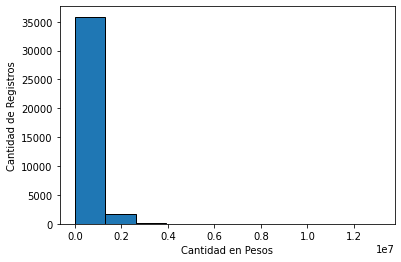

In [21]:
plt.hist(df['Renta'], edgecolor='black')
plt.xlabel('Cantidad en Pesos')
plt.ylabel('Cantidad de Registros')
plt.show()

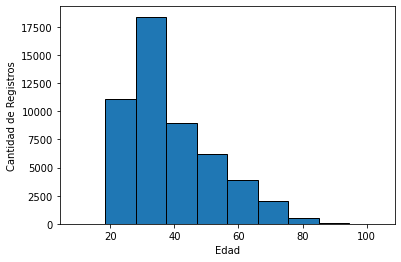

In [22]:
plt.hist(df['Edad'], edgecolor='black')
plt.xlabel('Edad')
plt.ylabel('Cantidad de Registros')
plt.show()

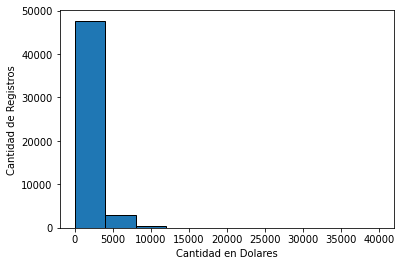

In [23]:
plt.hist(df['CUPO_MX'], edgecolor='black')
plt.xlabel('Cantidad en Dolares')
plt.ylabel('Cantidad de Registros')
plt.show()

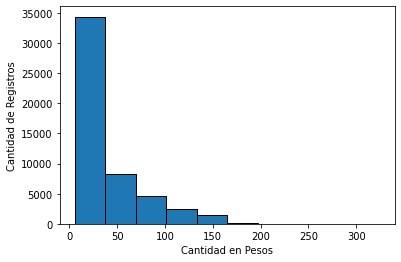

In [24]:
plt.hist(df['Antiguedad'], edgecolor='black')
plt.xlabel('Cantidad en Pesos')
plt.ylabel('Cantidad de Registros')
plt.show()

In [25]:
bins = np.linspace(dfnuevo.Renta.min(), dfnuevo.Renta.max(), 10)
bins

array([1.00000000e+00, 1.45437056e+06, 2.90874011e+06, 4.36310967e+06,
       5.81747922e+06, 7.27184878e+06, 8.72621833e+06, 1.01805879e+07,
       1.16349574e+07, 1.30893270e+07])

In [26]:
df['Renta'].max()

13089327.0

In [27]:
df['Renta'].min()

1.0

In [28]:
df[df.Renta==13089327][['Sexo', 'Edad','Region', 'CUPO_L1', 'Renta']]

,Sexo,Edad,Region,CUPO_L1,Renta
43983,H,56,3.0,2000000,13089327.0


In [29]:
df[df.Renta==1][['Sexo', 'Edad','Region', 'CUPO_L1', 'Renta']]

,Sexo,Edad,Region,CUPO_L1,Renta
221,H,48,9.0,1200000,1.0
302,H,44,5.0,1300000,1.0
743,H,44,13.0,400000,1.0
1069,H,47,9.0,1000000,1.0
1348,H,47,13.0,1175000,1.0
...,...,...,...,...,...
49703,M,57,13.0,1160000,1.0
49762,M,47,13.0,480000,1.0
50209,M,48,13.0,1200000,1.0
50593,M,53,13.0,2576250,1.0


In [30]:
dfnuevo['Renta'].mode()[0]

400000.0

In [31]:
dfnuevo['Renta'].mean()

663077.0787263963

In [32]:
# Transformamos de Variable Categorica a Numericas con GET DUMMIES
df_dummies = pd.get_dummies(dfnuevo[['Sexo']], drop_first= True)

df_new = pd.concat([dfnuevo, df_dummies], axis=1)
df_new

,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Consumo,Debito,Ctacte,Cuentas,Hipotecario,Monoproducto,TC,CUPO_L1,CUPO_MX,CUPO_L2,Sexo_M
0,160,M,13.0,43,NaN,130,1,1,0,0,1,1,1,0,0,3,798000,1210.0,1012000.0,1
1,160,H,13.0,46,143640.0,69,1,0,0,0,0,1,1,1,0,1,750000,1000.0,150000.0,0
2,170,H,13.0,45,929106.0,24,1,1,0,0,1,1,1,1,0,2,1350000,1500.0,200000.0,0
3,151,H,13.0,46,172447.0,134,0,1,0,0,0,0,1,0,1,2,1570800,0.0,220001.0,0
4,170,H,13.0,46,805250.0,116,0,1,1,0,0,1,2,1,0,3,2762000,6430.0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,160,H,13.0,51,364978.0,57,1,1,1,0,1,1,2,0,0,3,999000,550.0,1000.0,0
51120,170,H,13.0,51,625376.0,39,1,0,0,0,1,1,1,0,0,1,1744200,300.0,1.0,0
51121,160,H,13.0,47,806220.0,153,1,1,0,0,1,1,1,0,0,2,1061000,1526.0,194700.0,0
51122,160,M,13.0,47,NaN,11,1,0,0,0,0,1,1,0,0,1,1612000,2300.0,300000.0,1


In [33]:
df_new = df_new.drop(['Sexo'], axis=1)
df_new

,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Consumo,Debito,Ctacte,Cuentas,Hipotecario,Monoproducto,TC,CUPO_L1,CUPO_MX,CUPO_L2,Sexo_M
0,160,13.0,43,NaN,130,1,1,0,0,1,1,1,0,0,3,798000,1210.0,1012000.0,1
1,160,13.0,46,143640.0,69,1,0,0,0,0,1,1,1,0,1,750000,1000.0,150000.0,0
2,170,13.0,45,929106.0,24,1,1,0,0,1,1,1,1,0,2,1350000,1500.0,200000.0,0
3,151,13.0,46,172447.0,134,0,1,0,0,0,0,1,0,1,2,1570800,0.0,220001.0,0
4,170,13.0,46,805250.0,116,0,1,1,0,0,1,2,1,0,3,2762000,6430.0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,160,13.0,51,364978.0,57,1,1,1,0,1,1,2,0,0,3,999000,550.0,1000.0,0
51120,170,13.0,51,625376.0,39,1,0,0,0,1,1,1,0,0,1,1744200,300.0,1.0,0
51121,160,13.0,47,806220.0,153,1,1,0,0,1,1,1,0,0,2,1061000,1526.0,194700.0,0
51122,160,13.0,47,NaN,11,1,0,0,0,0,1,1,0,0,1,1612000,2300.0,300000.0,1


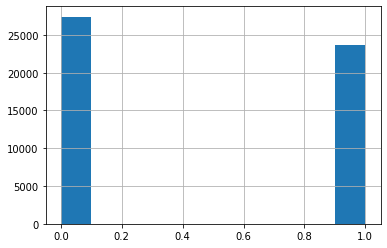

In [34]:
df_new['Sexo_M'].hist()

In [35]:
# Se crea primero el objeto MinMaxScaler
scalerNorm = MinMaxScaler()

# Luego "entrenamos" con los datos para obtener los parámetros del escalamiento
scalerNorm.fit(df_new)

# Finalmente aplicamos el escalamiento
array_scalerNorm = scalerNorm.transform(df_new)
array_scalerNorm

array([[1.11386139e-02, 1.00000000e+00, 3.57894737e-01, ...,
        3.02500000e-02, 8.06374502e-02, 1.00000000e+00],
       [1.11386139e-02, 1.00000000e+00, 3.89473684e-01, ...,
        2.50000000e-02, 1.19521912e-02, 0.00000000e+00],
       [2.35148515e-02, 1.00000000e+00, 3.78947368e-01, ...,
        3.75000000e-02, 1.59362550e-02, 0.00000000e+00],
       ...,
       [1.11386139e-02, 1.00000000e+00, 4.00000000e-01, ...,
        3.81500000e-02, 1.55139442e-02, 0.00000000e+00],
       [1.11386139e-02, 1.00000000e+00, 4.00000000e-01, ...,
        5.75000000e-02, 2.39043825e-02, 1.00000000e+00],
       [2.35148515e-02, 1.00000000e+00, 4.42105263e-01, ...,
        8.02500000e-02, 7.96812749e-08, 0.00000000e+00]])

In [36]:
df_scalerNorm = pd.DataFrame(array_scalerNorm)
df_scalerNorm

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,0.011139,1.0,0.357895,NaN,0.389937,1.0,1.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.181818,0.037058,0.03025,8.063745e-02,1.0
1,0.011139,1.0,0.389474,0.010974,0.198113,1.0,0.0,0.0,0.0,0.0,1.0,0.00,1.0,0.0,0.000000,0.034829,0.02500,1.195219e-02,0.0
2,0.023515,1.0,0.378947,0.070982,0.056604,1.0,1.0,0.0,0.0,1.0,1.0,0.00,1.0,0.0,0.090909,0.062692,0.03750,1.593625e-02,0.0
3,0.000000,1.0,0.389474,0.013175,0.402516,0.0,1.0,0.0,0.0,0.0,0.0,0.00,0.0,1.0,0.090909,0.072945,0.00000,1.752996e-02,0.0
4,0.023515,1.0,0.389474,0.061520,0.345912,0.0,1.0,1.0,0.0,0.0,1.0,0.25,1.0,0.0,0.181818,0.128262,0.16075,1.593625e-07,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,0.011139,1.0,0.442105,0.027884,0.160377,1.0,1.0,1.0,0.0,1.0,1.0,0.25,0.0,0.0,0.181818,0.046392,0.01375,7.968127e-05,0.0
51120,0.023515,1.0,0.442105,0.047777,0.103774,1.0,0.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.000000,0.080997,0.00750,7.968127e-08,0.0
51121,0.011139,1.0,0.400000,0.061594,0.462264,1.0,1.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.090909,0.049271,0.03815,1.551394e-02,0.0
51122,0.011139,1.0,0.400000,NaN,0.015723,1.0,0.0,0.0,0.0,0.0,1.0,0.00,0.0,0.0,0.000000,0.074858,0.05750,2.390438e-02,1.0


In [37]:
df_scalerNorm.columns = df_new.columns
df_scalerNorm

,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Consumo,Debito,Ctacte,Cuentas,Hipotecario,Monoproducto,TC,CUPO_L1,CUPO_MX,CUPO_L2,Sexo_M
0,0.011139,1.0,0.357895,NaN,0.389937,1.0,1.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.181818,0.037058,0.03025,8.063745e-02,1.0
1,0.011139,1.0,0.389474,0.010974,0.198113,1.0,0.0,0.0,0.0,0.0,1.0,0.00,1.0,0.0,0.000000,0.034829,0.02500,1.195219e-02,0.0
2,0.023515,1.0,0.378947,0.070982,0.056604,1.0,1.0,0.0,0.0,1.0,1.0,0.00,1.0,0.0,0.090909,0.062692,0.03750,1.593625e-02,0.0
3,0.000000,1.0,0.389474,0.013175,0.402516,0.0,1.0,0.0,0.0,0.0,0.0,0.00,0.0,1.0,0.090909,0.072945,0.00000,1.752996e-02,0.0
4,0.023515,1.0,0.389474,0.061520,0.345912,0.0,1.0,1.0,0.0,0.0,1.0,0.25,1.0,0.0,0.181818,0.128262,0.16075,1.593625e-07,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,0.011139,1.0,0.442105,0.027884,0.160377,1.0,1.0,1.0,0.0,1.0,1.0,0.25,0.0,0.0,0.181818,0.046392,0.01375,7.968127e-05,0.0
51120,0.023515,1.0,0.442105,0.047777,0.103774,1.0,0.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.000000,0.080997,0.00750,7.968127e-08,0.0
51121,0.011139,1.0,0.400000,0.061594,0.462264,1.0,1.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.090909,0.049271,0.03815,1.551394e-02,0.0
51122,0.011139,1.0,0.400000,NaN,0.015723,1.0,0.0,0.0,0.0,0.0,1.0,0.00,0.0,0.0,0.000000,0.074858,0.05750,2.390438e-02,1.0


In [38]:
# Vemos los NaN
for col in df_scalerNorm.columns:
  print(col,'=', df_scalerNorm[col].isna().sum())

Subsegmento = 0
Region = 53
Edad = 0
Renta = 13365
Antiguedad = 0
Internauta = 0
Adicional = 0
Dualidad = 0
Consumo = 0
Debito = 0
Ctacte = 0
Cuentas = 0
Hipotecario = 0
Monoproducto = 0
TC = 0
CUPO_L1 = 0
CUPO_MX = 0
CUPO_L2 = 0
Sexo_M = 0


In [39]:
# Copia del DataFrame Original
datos_knn = df_scalerNorm.copy()
datos_knn = pd.DataFrame(datos_knn)
datos_knn

,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Consumo,Debito,Ctacte,Cuentas,Hipotecario,Monoproducto,TC,CUPO_L1,CUPO_MX,CUPO_L2,Sexo_M
0,0.011139,1.0,0.357895,NaN,0.389937,1.0,1.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.181818,0.037058,0.03025,8.063745e-02,1.0
1,0.011139,1.0,0.389474,0.010974,0.198113,1.0,0.0,0.0,0.0,0.0,1.0,0.00,1.0,0.0,0.000000,0.034829,0.02500,1.195219e-02,0.0
2,0.023515,1.0,0.378947,0.070982,0.056604,1.0,1.0,0.0,0.0,1.0,1.0,0.00,1.0,0.0,0.090909,0.062692,0.03750,1.593625e-02,0.0
3,0.000000,1.0,0.389474,0.013175,0.402516,0.0,1.0,0.0,0.0,0.0,0.0,0.00,0.0,1.0,0.090909,0.072945,0.00000,1.752996e-02,0.0
4,0.023515,1.0,0.389474,0.061520,0.345912,0.0,1.0,1.0,0.0,0.0,1.0,0.25,1.0,0.0,0.181818,0.128262,0.16075,1.593625e-07,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,0.011139,1.0,0.442105,0.027884,0.160377,1.0,1.0,1.0,0.0,1.0,1.0,0.25,0.0,0.0,0.181818,0.046392,0.01375,7.968127e-05,0.0
51120,0.023515,1.0,0.442105,0.047777,0.103774,1.0,0.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.000000,0.080997,0.00750,7.968127e-08,0.0
51121,0.011139,1.0,0.400000,0.061594,0.462264,1.0,1.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.090909,0.049271,0.03815,1.551394e-02,0.0
51122,0.011139,1.0,0.400000,NaN,0.015723,1.0,0.0,0.0,0.0,0.0,1.0,0.00,0.0,0.0,0.000000,0.074858,0.05750,2.390438e-02,1.0


In [40]:
# Configuramos el KNN Imputer
# Lo imputamos con K=5 
knn_imputer = KNNImputer(n_neighbors=5, weights="uniform")

In [41]:
# Transformamos las variables que tienen NAN
datos_knn[['Region', 'Renta']] = knn_imputer.fit_transform(datos_knn[['Region', 'Renta']])
datos_knn

,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Consumo,Debito,Ctacte,Cuentas,Hipotecario,Monoproducto,TC,CUPO_L1,CUPO_MX,CUPO_L2,Sexo_M
0,0.011139,1.0,0.357895,0.030630,0.389937,1.0,1.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.181818,0.037058,0.03025,8.063745e-02,1.0
1,0.011139,1.0,0.389474,0.010974,0.198113,1.0,0.0,0.0,0.0,0.0,1.0,0.00,1.0,0.0,0.000000,0.034829,0.02500,1.195219e-02,0.0
2,0.023515,1.0,0.378947,0.070982,0.056604,1.0,1.0,0.0,0.0,1.0,1.0,0.00,1.0,0.0,0.090909,0.062692,0.03750,1.593625e-02,0.0
3,0.000000,1.0,0.389474,0.013175,0.402516,0.0,1.0,0.0,0.0,0.0,0.0,0.00,0.0,1.0,0.090909,0.072945,0.00000,1.752996e-02,0.0
4,0.023515,1.0,0.389474,0.061520,0.345912,0.0,1.0,1.0,0.0,0.0,1.0,0.25,1.0,0.0,0.181818,0.128262,0.16075,1.593625e-07,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,0.011139,1.0,0.442105,0.027884,0.160377,1.0,1.0,1.0,0.0,1.0,1.0,0.25,0.0,0.0,0.181818,0.046392,0.01375,7.968127e-05,0.0
51120,0.023515,1.0,0.442105,0.047777,0.103774,1.0,0.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.000000,0.080997,0.00750,7.968127e-08,0.0
51121,0.011139,1.0,0.400000,0.061594,0.462264,1.0,1.0,0.0,0.0,1.0,1.0,0.00,0.0,0.0,0.090909,0.049271,0.03815,1.551394e-02,0.0
51122,0.011139,1.0,0.400000,0.030630,0.015723,1.0,0.0,0.0,0.0,0.0,1.0,0.00,0.0,0.0,0.000000,0.074858,0.05750,2.390438e-02,1.0


In [42]:
# Vemos los NaN luego de Imputar 
for col in datos_knn.columns:
  print(col,'=', datos_knn[col].isna().sum())

Subsegmento = 0
Region = 0
Edad = 0
Renta = 0
Antiguedad = 0
Internauta = 0
Adicional = 0
Dualidad = 0
Consumo = 0
Debito = 0
Ctacte = 0
Cuentas = 0
Hipotecario = 0
Monoproducto = 0
TC = 0
CUPO_L1 = 0
CUPO_MX = 0
CUPO_L2 = 0
Sexo_M = 0


In [43]:
ProfileReport(datos_knn)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]